# (8주차) 10월25일 
> 이미지자료분석 - Transfer Learning, CAM (설명가능한 인공지능모형, XAI) 

- toc:true
- branch: master
- badges: true
- comments: true
- author: 최규빈

## 강의영상 

> youtube: https://youtube.com/playlist?list=PLQqh36zP38-xkHPJ1DiPKfseoBl9yUY4P

## imports

In [119]:
import torch 
import torchvision
from fastai.vision.all import * 

## Transfer Learning 

In [2]:
path = untar_data(URLs.CIFAR)

In [3]:
path.ls()

(#3) [Path('/home/cgb4/.fastai/data/cifar10/labels.txt'),Path('/home/cgb4/.fastai/data/cifar10/train'),Path('/home/cgb4/.fastai/data/cifar10/test')]

### 수제네트워크

(1) dls

In [68]:
dls = ImageDataLoaders.from_folder(path,train='train',valid='test') 

In [75]:
_X,_y = dls.one_batch()
_X.shape, _y.shape

(torch.Size([64, 3, 32, 32]), torch.Size([64]))

In [77]:
!ls /home/cgb4/.fastai/data/cifar10/train # 10개의 클래스

airplane  automobile  bird  cat  deer  dog  frog  horse  ship  truck


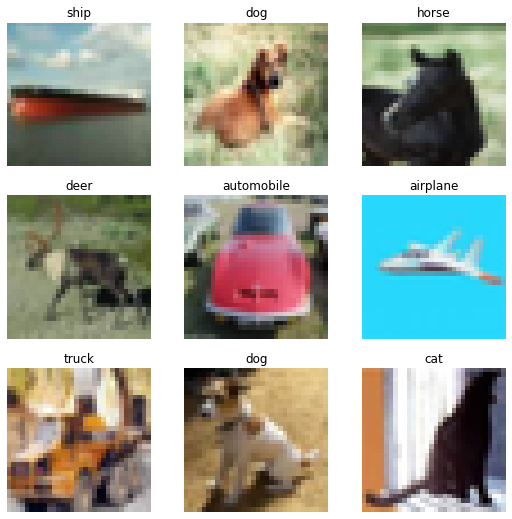

In [78]:
dls.show_batch()

(2) lrnr 생성 

In [82]:
net1 = torch.nn.Sequential(
    torch.nn.Conv2d(3,128,(5,5)),
    torch.nn.ReLU(),
    torch.nn.MaxPool2d((2,2)),
    torch.nn.Flatten()
)

In [88]:
net1(_X.to("cpu")).shape

torch.Size([64, 25088])

In [94]:
net = torch.nn.Sequential(
    net1, 
    torch.nn.Linear(25088,10)
)
loss_fn = torch.nn.CrossEntropyLoss() 
lrnr = Learner(dls,net,loss_fn,metrics=accuracy) 

(3) 학습

In [95]:
lrnr.fit(10)

epoch,train_loss,valid_loss,accuracy,time
0,1.104867,1.105857,0.620600,00:04
1,0.961969,1.050836,0.640000,00:04
2,0.902597,1.058793,0.637600,00:04
3,0.854093,1.036581,0.657200,00:04
4,0.779191,1.013788,0.663400,00:04
5,0.723487,1.091586,0.642500,00:04
6,0.694052,1.064836,0.655700,00:04
7,0.629718,1.044633,0.668900,00:04
8,0.589516,1.168362,0.645100,00:04
9,0.572035,1.117689,0.654800,00:04


- 이게 생각보다 잘 안맞아요.. 70넘기 힘듬 

### 전이학습 (남이 만든 네트워크)

(2) lrnr 생성 

In [109]:
#collapse_output
net = torchvision.models.resnet18(weights=torchvision.models.resnet.ResNet18_Weights.IMAGENET1K_V1)
net

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

- $k=1000$ 즉 1000개의 물체를 구분하는 모형임 

In [116]:
net.fc = torch.nn.Linear(in_features=512, out_features=10) 

In [117]:
loss_fn = torch.nn.CrossEntropyLoss() 
lrnr = Learner(dls,net,loss_fn,metrics=accuracy)

(3) 학습

In [118]:
lrnr.fit(10) 

epoch,train_loss,valid_loss,accuracy,time
0,0.813139,0.803660,0.735300,00:10
1,0.667533,0.742656,0.756300,00:11
2,0.544296,0.735011,0.755900,00:10
3,0.449801,0.671868,0.784000,00:10
4,0.390996,0.657825,0.780100,00:11
5,0.310046,0.690071,0.788700,00:10
6,0.259605,0.671683,0.802500,00:10
7,0.199240,0.715251,0.796800,00:10
8,0.195551,0.772891,0.795100,00:10
9,0.150421,0.764864,0.801600,00:10


- CIFAR10을 맞추기 위한 네트워크가 아님에도 불구하고 상당히 잘맞음
- 일반인이 거의 밑바닥에서 설계하는것보다 전이학습을 이용하는 것이 효율적일 경우가 많다. 

### 전이학습 다른 구현: 순수 fastai 이용 

`-` 예전코드 복습

In [130]:
path = untar_data(URLs.PETS)/'images'

In [120]:
files= get_image_files(path)

In [121]:
def label_func(fname):
    if fname[0].isupper():
        return 'cat'
    else:
        return 'dog'

In [122]:
dls = ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(512)) 

In [133]:
lrnr = vision_learner(dls,resnet34,metrics=accuracy) 

In [127]:
lrnr.fine_tune(1)

epoch,train_loss,valid_loss,accuracy,time
0,0.191067,0.027880,0.991881,00:29


epoch,train_loss,valid_loss,accuracy,time
0,0.039166,0.012174,0.996617,00:37


`-` 사실 위의 코드가 transfer learning 이었음. 

In [134]:
#collapse_output
lrnr.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

## CAM

### CAM이란? 

- ref: http://cnnlocalization.csail.mit.edu/Zhou_Learning_Deep_Features_CVPR_2016_paper.pdf

`-` Class Activation Mapping (CAM)은 설명가능한 인공지능모형 (eXplainable Artificial Intelligence, XAI) 중 하나로 CNN의 판단근거를 시각화하는 기술

### 학습에 사용할 데이터 Load

In [120]:
path = untar_data(URLs.PETS)/'images'

In [121]:
path.ls()

(#7393) [Path('/home/cgb4/.fastai/data/oxford-iiit-pet/images/miniature_pinscher_81.jpg'),Path('/home/cgb4/.fastai/data/oxford-iiit-pet/images/english_setter_78.jpg'),Path('/home/cgb4/.fastai/data/oxford-iiit-pet/images/chihuahua_156.jpg'),Path('/home/cgb4/.fastai/data/oxford-iiit-pet/images/english_cocker_spaniel_181.jpg'),Path('/home/cgb4/.fastai/data/oxford-iiit-pet/images/scottish_terrier_131.jpg'),Path('/home/cgb4/.fastai/data/oxford-iiit-pet/images/Bengal_188.jpg'),Path('/home/cgb4/.fastai/data/oxford-iiit-pet/images/yorkshire_terrier_101.jpg'),Path('/home/cgb4/.fastai/data/oxford-iiit-pet/images/British_Shorthair_41.jpg'),Path('/home/cgb4/.fastai/data/oxford-iiit-pet/images/great_pyrenees_49.jpg'),Path('/home/cgb4/.fastai/data/oxford-iiit-pet/images/wheaten_terrier_194.jpg')...]

In [122]:
files= get_image_files(path)
def label_func(fname):
    if fname[0].isupper():
        return 'cat'
    else:
        return 'dog'
dls = ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(512)) 

### 구현0단계-- 예비학습

#### `#` 하나의 이미지 선택 

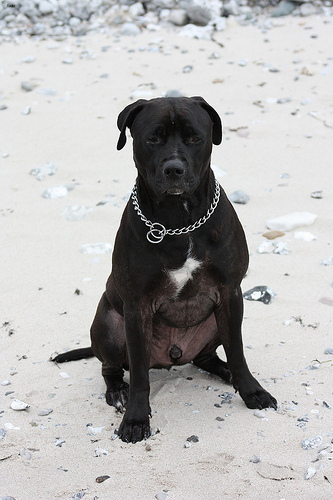

In [123]:
ximg = PILImage.create('/home/cgb4/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_106.jpg')
ximg

In [124]:
x = first(dls.test_dl([ximg]))[0]
x

TensorImage([[[[0.9059, 0.9059, 0.9098,  ..., 0.9059, 0.9059, 0.9059],
               [0.9059, 0.9059, 0.9098,  ..., 0.9059, 0.9059, 0.9059],
               [0.9059, 0.9059, 0.9098,  ..., 0.9059, 0.9059, 0.9059],
               ...,
               [0.8745, 0.8784, 0.8824,  ..., 0.8902, 0.8863, 0.8824],
               [0.9059, 0.8980, 0.8902,  ..., 0.8824, 0.8863, 0.8824],
               [0.8863, 0.8863, 0.8824,  ..., 0.8784, 0.8863, 0.8863]],

              [[0.9137, 0.9137, 0.9176,  ..., 0.9059, 0.9059, 0.9059],
               [0.9137, 0.9137, 0.9176,  ..., 0.9059, 0.9059, 0.9059],
               [0.9137, 0.9137, 0.9176,  ..., 0.9059, 0.9059, 0.9059],
               ...,
               [0.8784, 0.8824, 0.8863,  ..., 0.8745, 0.8667, 0.8588],
               [0.9098, 0.9020, 0.8902,  ..., 0.8745, 0.8706, 0.8627],
               [0.8902, 0.8902, 0.8784,  ..., 0.8784, 0.8745, 0.8706]],

              [[0.9098, 0.9098, 0.9137,  ..., 0.9137, 0.9137, 0.9137],
               [0.9098, 0.9098, 0

#### `#` AP layer 

In [125]:
ap = torch.nn.AdaptiveAvgPool2d(output_size=1) 

In [126]:
X = torch.arange(48).reshape(1,3,4,4)*1.0 
X

tensor([[[[ 0.,  1.,  2.,  3.],
          [ 4.,  5.,  6.,  7.],
          [ 8.,  9., 10., 11.],
          [12., 13., 14., 15.]],

         [[16., 17., 18., 19.],
          [20., 21., 22., 23.],
          [24., 25., 26., 27.],
          [28., 29., 30., 31.]],

         [[32., 33., 34., 35.],
          [36., 37., 38., 39.],
          [40., 41., 42., 43.],
          [44., 45., 46., 47.]]]])

In [127]:
ap(X)

tensor([[[[ 7.5000]],

         [[23.5000]],

         [[39.5000]]]])

In [128]:
X[0,0,...].mean(),X[0,1,...].mean(),X[0,2,...].mean()

(tensor(7.5000), tensor(23.5000), tensor(39.5000))

#### `#` torch.einsum

(예시1)

In [129]:
tsr = torch.arange(12).reshape(4,3)
tsr

tensor([[ 0,  1,  2],
        [ 3,  4,  5],
        [ 6,  7,  8],
        [ 9, 10, 11]])

In [130]:
torch.einsum('ij->ji',tsr)

tensor([[ 0,  3,  6,  9],
        [ 1,  4,  7, 10],
        [ 2,  5,  8, 11]])

(예시2)

In [131]:
tsr1 = torch.arange(12).reshape(4,3).float()
tsr2 = torch.arange(15).reshape(3,5).float()

In [132]:
tsr1 @ tsr2

tensor([[ 25.,  28.,  31.,  34.,  37.],
        [ 70.,  82.,  94., 106., 118.],
        [115., 136., 157., 178., 199.],
        [160., 190., 220., 250., 280.]])

In [133]:
torch.einsum('ij,jk -> ik',tsr1,tsr2) 

tensor([[ 25.,  28.,  31.,  34.,  37.],
        [ 70.,  82.,  94., 106., 118.],
        [115., 136., 157., 178., 199.],
        [160., 190., 220., 250., 280.]])

(예시3)

In [134]:
x.to("cpu").shape

torch.Size([1, 3, 512, 512])

In [135]:
torch.einsum('ocij -> ijc',x.to("cpu")).shape

torch.Size([512, 512, 3])

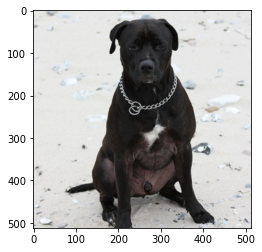

In [136]:
plt.imshow(torch.einsum('ocij -> ijc',x.to("cpu")))

### 구현1단계-- 이미지분류 잘하는 네트워크 선택 

In [137]:
lrnr = vision_learner(dls,resnet34,metrics=accuracy) 

/home/cgb4/anaconda3/envs/py37/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/home/cgb4/anaconda3/envs/py37/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [138]:
lrnr.fine_tune(1)

epoch,train_loss,valid_loss,accuracy,time
0,0.169602,0.011903,0.996617,00:29


epoch,train_loss,valid_loss,accuracy,time
0,0.052203,0.012352,0.998647,00:38


### 구현2단계-- 네트워크의 끝 부분 수정 

`-` 모형의 분해 

In [139]:
net1= lrnr.model[0]
net2= lrnr.model[1]

`-` net2를 좀더 살펴보자. 

In [140]:
net2

Sequential(
  (0): AdaptiveConcatPool2d(
    (ap): AdaptiveAvgPool2d(output_size=1)
    (mp): AdaptiveMaxPool2d(output_size=1)
  )
  (1): fastai.layers.Flatten(full=False)
  (2): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): Dropout(p=0.25, inplace=False)
  (4): Linear(in_features=1024, out_features=512, bias=False)
  (5): ReLU(inplace=True)
  (6): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): Dropout(p=0.5, inplace=False)
  (8): Linear(in_features=512, out_features=2, bias=False)
)

In [141]:
_X, _y = dls.one_batch() 

In [142]:
net1.to("cpu")
net2.to("cpu") 
_X = _X.to("cpu")

In [143]:
print(net1(_X).shape)
print(net2[0](net1(_X)).shape)
print(net2[1](net2[0](net1(_X))).shape)
print(net2[2](net2[1](net2[0](net1(_X)))).shape)

torch.Size([64, 512, 16, 16])
torch.Size([64, 1024, 1, 1])
torch.Size([64, 1024])
torch.Size([64, 1024])


`-` net2를 아래와 같이 수정하고 재학습하자 (왜?) 

In [144]:
net2= torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), # (64,512,16,16) -> (64,512,1,1) 
    torch.nn.Flatten(), # (64,512,1,1) -> (64,512) 
    torch.nn.Linear(512,2,bias=False) # (64,512) -> (64,2) 
)

In [147]:
net = torch.nn.Sequential(
    net1,
    net2
)

In [148]:
lrnr2= Learner(dls,net,metrics=accuracy) # loss_fn??

In [149]:
lrnr2.loss_func, lrnr.loss_func ## 알아서 기존의 loss function으로 잘 들어가 있음. 

(FlattenedLoss of CrossEntropyLoss(), FlattenedLoss of CrossEntropyLoss())

In [150]:
lrnr2.fine_tune(5) # net2를 수정해서 accuracy가 안좋아지긴 했는데 그래도 쓸만함 

epoch,train_loss,valid_loss,accuracy,time
0,0.252908,0.741022,0.755751,00:38


epoch,train_loss,valid_loss,accuracy,time
0,0.130946,0.126084,0.957375,00:38
1,0.143405,0.229703,0.905954,00:38
2,0.092800,0.104366,0.962788,00:38
3,0.046969,0.043439,0.983762,00:38
4,0.024211,0.038318,0.983762,00:38


### 구현3단계-- 수정된 net2에서 Linear와 AP의 순서를 바꿈 

`-` 1개의 observation을 고정하였을 경우 출력과정 상상 

In [153]:
ximg = PILImage.create('/home/cgb4/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_106.jpg')
x = first(dls.test_dl([ximg]))[0]

In [155]:
net2

Sequential(
  (0): AdaptiveAvgPool2d(output_size=1)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): Linear(in_features=512, out_features=2, bias=False)
)

In [99]:
print(net1(x).shape)
print(net2[0](net1(x)).shape)
print(net2[1](net2[0](net1(x))).shape)
print(net2[2](net2[1](net2[0](net1(x)))).shape)

torch.Size([1, 512, 16, 16])
torch.Size([1, 512, 1, 1])
torch.Size([1, 512])
torch.Size([1, 2])


`-` 최종결과 확인 

In [156]:
net(x)

TensorImage([[-9.0358,  9.0926]], device='cuda:0', grad_fn=<AliasBackward0>)

In [158]:
dls.vocab

['cat', 'dog']

- net(x)에서 뒤쪽의 값이 클수록 'dog'를 의미한다. 

`-` net2의 순서 바꾸기 전 전체 네트워크: 

$$\underset{(1,3,512,512)}{\boldsymbol x} \overset{net_1}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{ap}{\to} \underset{(1,512,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,512)}{{\boldsymbol \sharp}}\overset{linear}{\to} \underset{(1,2)}{\hat{\boldsymbol y}}\right) = [-9.0358,  9.0926]$$

`-` 아래와 같이 순서를 바꿔서 한번 계산해보고 싶다. (왜???..)

$$\underset{(1,3,224,224)}{\boldsymbol x} \overset{net_1}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{linear}{\to} \underset{(1,2,16,16)}{{\bf why}}\overset{ap}{\to} \underset{(1,2,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,2)}{\hat{\boldsymbol y}}\right) = [−9.0358,9.0926]$$

- 여기에서 (1,512,16,16) -> (1,2,16,16) 로 가는 선형변환을 적용하는 방법? **(16,16) each pixel에 대하여 (512 $\to$ 2)로 가는 변환을 수행**

`-` 통찰: 이 경우 특이하게도 레이어의 순서를 바꿨을때 출력이 동일함 (선형변환하고 평균내거나 평균내고 선형변환하는건 같으니까) 

In [160]:
_x =torch.tensor([1,2,3.14,4]).reshape(4,1)
_x 

tensor([[1.0000],
        [2.0000],
        [3.1400],
        [4.0000]])

In [168]:
_l1 = torch.nn.Linear(1,1,bias=False)
_l1(_x).mean() # _x -> 선형변환 -> 평균 

tensor(-1.4045, grad_fn=<MeanBackward0>)

In [169]:
_l1(_x.mean().reshape(1,1)) # _x -> 평균 -> 선형변환

tensor([[-1.4045]], grad_fn=<MmBackward0>)

`-` 구현해보자. 

In [181]:
why = torch.einsum('cb,abij->acij',net2[2].weight,net1(x))

In [185]:
net2[0](why)

TensorImage([[[[-9.0358]],

              [[ 9.0926]]]], device='cuda:0', grad_fn=<AliasBackward0>)

In [186]:
net(x)

TensorImage([[-9.0358,  9.0926]], device='cuda:0', grad_fn=<AliasBackward0>)

### 잠깐 멈추고 생각

`-` 이미지

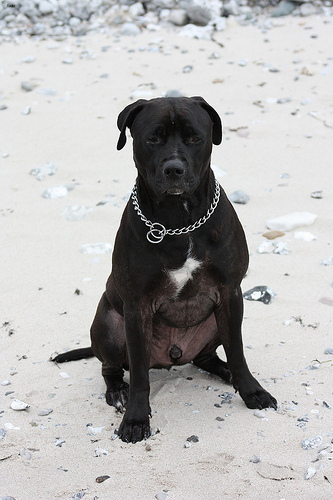

In [187]:
ximg

`-` 네트워크의 결과

In [191]:
net2(net1(x))

TensorImage([[-9.0358,  9.0926]], device='cuda:0', grad_fn=<AliasBackward0>)

- -9.0358 << 9.0926 이므로 'ximg'는 높은 확률로 개라는 뜻이다. 

`-` 아래의네트워크를 관찰 

$$\underset{(1,2,16,16)}{{\bf why}}\overset{ap}{\to} \underset{(1,2,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,2)}{\hat{\boldsymbol y}} = [-9.0358,9.0926]$$

In [196]:
net2[0](why)

TensorImage([[[[-9.0358]],

              [[ 9.0926]]]], device='cuda:0', grad_fn=<AliasBackward0>)

더 파고들어서 분석해보자. 

In [198]:
why.shape

torch.Size([1, 2, 16, 16])

In [204]:
(why[0,0,:,:]).mean(), (why[0,1,:,:]).mean()

(TensorImage(-9.0358, device='cuda:0', grad_fn=<AliasBackward0>),
 TensorImage(9.0926, device='cuda:0', grad_fn=<AliasBackward0>))

***`why[0,0,:,:]`***

In [225]:
#collapse_output
(why[0,0,:,:]).to(torch.int64)

TensorImage([[   0,    0,    0,    0,    0,    0,   -1,   -4,   -5,   -4,   -1,
                 0,    0,    0,    0,    0],
             [   0,    0,    0,    0,    0,   -1,  -12,  -26,  -33,  -28,  -14,
                -3,    0,    0,    0,    0],
             [   0,    0,    1,    1,    0,   -2,  -22,  -60,  -75,  -73,  -41,
               -10,    0,    0,    0,    0],
             [   0,    0,    0,    0,    0,   -2,  -25,  -75, -116, -110,  -64,
               -18,    0,    0,    0,    0],
             [   0,    0,    0,    0,    0,   -1,  -22,  -76, -147, -132,  -69,
               -21,   -1,    0,    0,    0],
             [   0,    0,    0,    0,    0,   -1,  -16,  -60, -112, -110,  -59,
               -18,   -3,    0,    0,   -7],
             [   0,    0,    0,    0,    0,    0,   -9,  -38,  -66,  -66,  -37,
               -12,   -2,    0,    0,   -2],
             [   0,    1,    1,    0,    0,    0,   -4,  -25,  -34,  -27,  -18,
                -6,   -1,    0,    0,    0],


- 이 값들의 평균은 -9.0358 이다. (이 값이 클수록 이 그림이 고양이라는 의미 = 이 값이 작을수록 이 그림이 고양이가 아니라는 의미) 
- 그런데 살펴보니 대부분의 위치에서 0에 가까운 값을 가짐. 다만 특정위치에서 엄청 큰 작은값이 있어서 -9.0358이라는 평균값이 나옴 $\to$ 특정위치에 존재하는 엄청 작은 값들은 ximg가 고양이가 아니라고 판단하는 근거가 된다. 

***`why[0,1,:,:]`***

In [226]:
#collapse_output
(why[0,1,:,:]).to(torch.int64)

TensorImage([[  0,   0,   0,   0,   0,   0,   1,   4,   5,   4,   1,   0,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   0,   1,  12,  27,  34,  29,  15,   3,   0,
                0,   0,   0],
             [  0,   0,  -1,  -1,   0,   2,  23,  62,  79,  76,  43,  11,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   0,   2,  26,  79, 122, 116,  66,  18,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   0,   1,  24,  81, 152, 136,  72,  21,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   0,   0,  18,  64, 116, 113,  61,  19,   3,
                0,   0,   6],
             [  0,   0,   0,   0,   0,   0,  10,  40,  69,  68,  38,  12,   1,
                0,   0,   2],
             [  0,  -1,  -1,   0,   0,   0,   4,  25,  35,  28,  18,   6,   1,
                0,   0,   0],
             [ -1,  -1,  -1,   0,   0,   0,   2,  10,  14,  10,   5,   1,   0,
                0,   0,   0],
             [  0, 

- 이 값들의 평균은 9.0926 이다. (이 값이 클수록 이 그림이 강아지라는 의미) 
- 그런데 살펴보니 대부분의 위치에서 0에 가까운 값을 가짐. 다만 특정위치에서 엄청 큰 값들이 있어서 9.0926이라는 평균값이 나옴 $\to$ 특정위치에 존재하는 엄청 큰 값들은 결국 ximg를 강아지라고 판단하는 근거가 된다. 

`-` 시각화

In [227]:
why_cat = why[0,0,:,:]
why_dog = why[0,1,:,:]

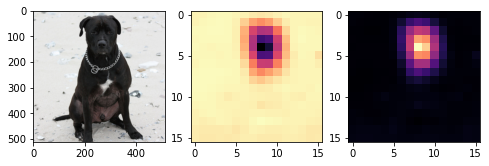

In [251]:
fig, ax = plt.subplots(1,3,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_cat.to("cpu").detach(),cmap='magma')
ax[2].imshow(why_dog.to("cpu").detach(),cmap='magma')

- magma = 검은색 < 보라색 < 빨간색 < 노란색
- 왼쪽그림의 검은 부분은 고양이가 아니라는 근거, 오른쪽그림의 노란부분은 강아지라는 근거 

`-` why_cat, why_dog를 (16,16) $\to$ (512,512) 로 resize 

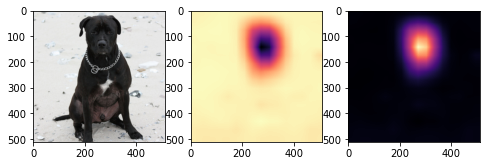

In [254]:
fig, ax = plt.subplots(1,3,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear')
ax[2].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear')

`-` 겹쳐그리기

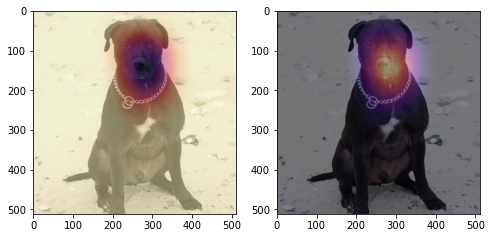

In [256]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)

`-` 하니이미지 시각화

In [263]:
#
#!wget https://github.com/guebin/DL2022/blob/master/_notebooks/2022-09-06-hani01.jpeg?raw=true
ximg= PILImage.create('2022-09-06-hani01.jpeg')
x= first(dls.test_dl([ximg]))[0]

In [264]:
why = torch.einsum('cb,abij->acij',net2[2].weight,net1(x))
why_cat = why[0,0,:,:]
why_dog = why[0,1,:,:]

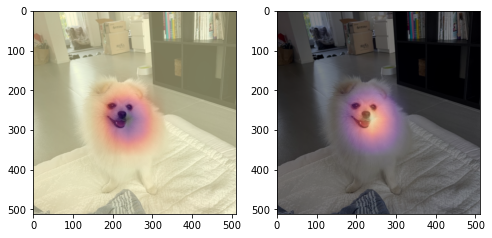

In [265]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)

`-` 하니이미지 시각화 with prob

In [267]:
sftmax=torch.nn.Softmax(dim=1)

In [268]:
sftmax(net(x))

TensorImage([[1.5489e-05, 9.9998e-01]], device='cuda:0',
            grad_fn=<AliasBackward0>)

In [272]:
catprob, dogprob = sftmax(net(x))[0,0].item(), sftmax(net(x))[0,1].item()

Text(0.5, 1.0, 'dogprob=0.999985')

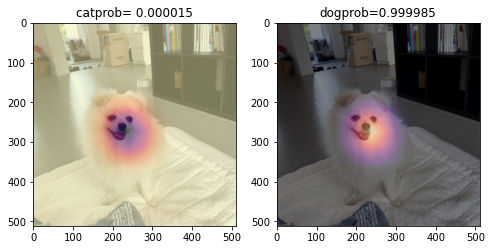

In [277]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[0].set_title('catprob= %f' % catprob) 
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].set_title('dogprob=%f' % dogprob)

### 구현4단계-- CAM 시각화 

In [278]:
sftmax = torch.nn.Softmax(dim=1)

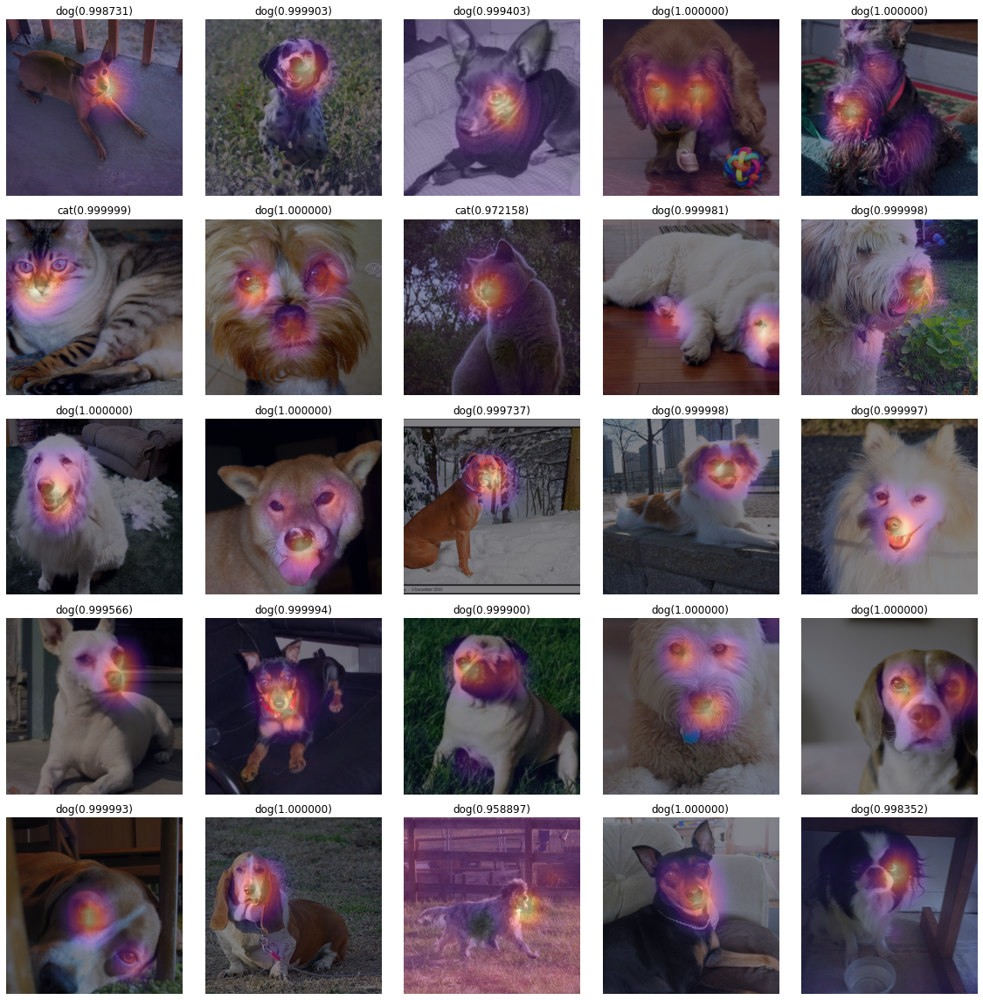

In [279]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

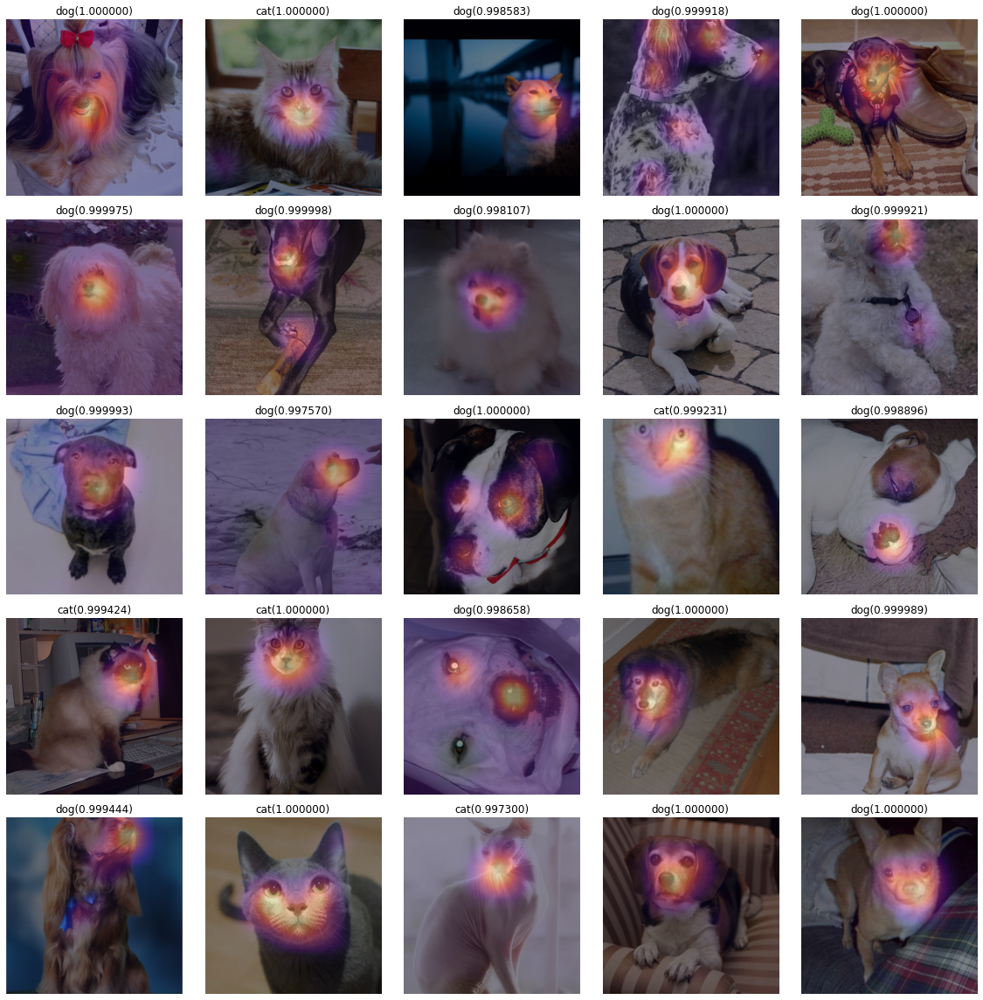

In [280]:
fig, ax = plt.subplots(5,5) 
k=25
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

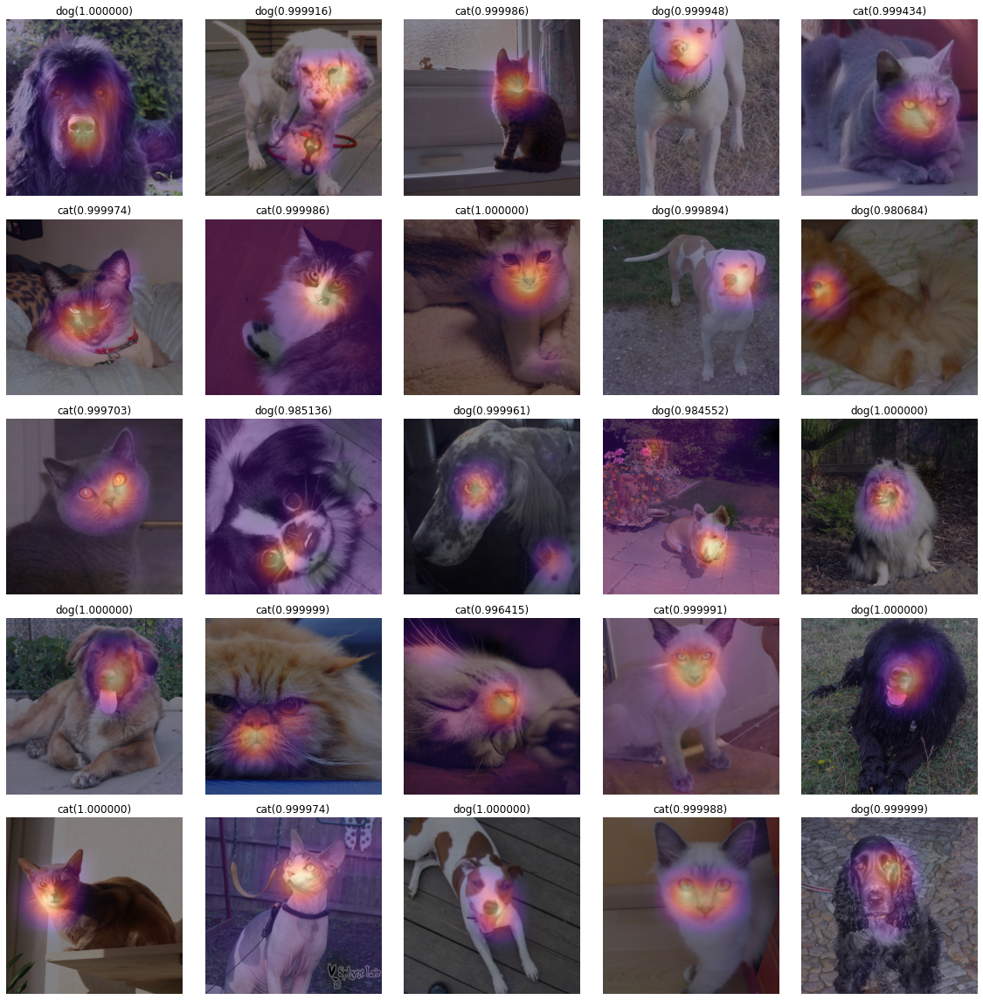

In [281]:
fig, ax = plt.subplots(5,5) 
k=50
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

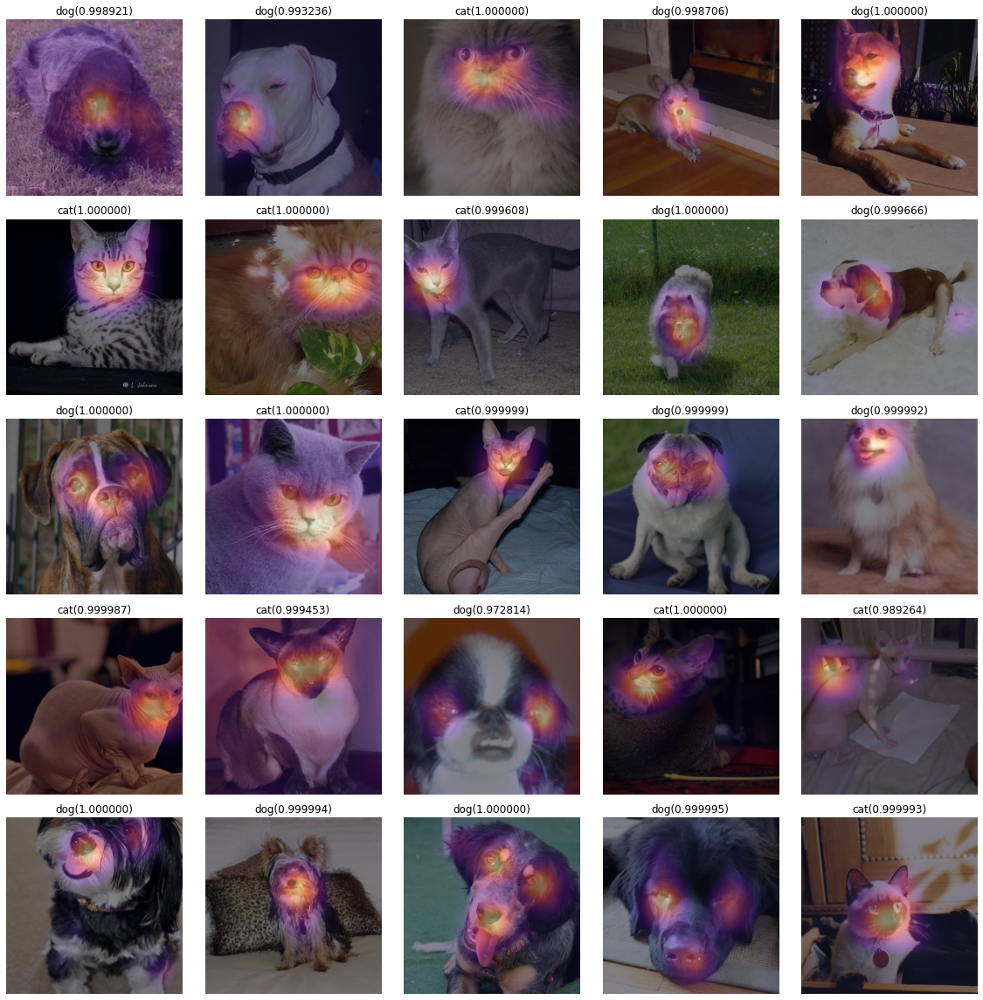

In [282]:
fig, ax = plt.subplots(5,5) 
k=75
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()